In [1]:
import numpyro
numpyro.enable_x64()
numpyro.set_platform("cpu")
numpyro.set_host_device_count(10)

import arviz as az
import numpy as np
import pandas as pd
import jax.numpy as jnp
from cycler import cycler
import matplotlib
import matplotlib.pyplot as plt
from jax import random, jit, lax, pmap, vmap
from corner import corner, overplot_points, overplot_lines
from numpyro import handlers
from numpyro.infer import MCMC, NUTS, init_to_uniform, init_to_feasible, Predictive, SVI, Trace_ELBO
from numpyro.infer.autoguide import AutoDelta, AutoBNAFNormal, AutoIAFNormal
from numpyro.optim import Adam
from eggman.infer import Star
from functools import partial

rng = random.PRNGKey(42)

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.
I0000 00:00:1698076252.859629  306840 tfrt_cpu_pjrt_client.cc:349] TfrtCpuClient created.


In [2]:
import numpyro.distributions as dist

In [3]:
from jax.scipy import stats

In [4]:
def clamp_probs(probs):
    finfo = jnp.finfo(jnp.result_type(probs, float))
    return jnp.clip(probs, a_min=finfo.tiny, a_max=1.0 - finfo.eps)

def truncnorm_ppf(q, a, b, loc=0.0, scale=1.0):
    q, a, b = np.broadcast_arrays(q, a, b)
    sign = jnp.where(loc >= a, 1.0, -1.0)
    
    tail_prob_at_low = stats.norm.cdf(loc - sign * (loc - a), loc=loc, scale=scale)
    tail_prob_at_high = stats.norm.cdf(loc - sign * (loc - b), loc=loc, scale=scale)
    
    return (1 - sign) * loc + sign * stats.norm.ppf(
            clamp_probs((1 - q) * tail_prob_at_low + q * tail_prob_at_high),
            loc=loc,
            scale=scale
        )

In [5]:
import dynesty
import dynesty.plotting as dyplot
from dynesty import NestedSampler

In [6]:
from eggman.emulator import Emulator

In [7]:
emulator = Emulator()

In [8]:
class NestedStar(Star):
    
    def __init__(self, mu, sigma, bands=None):
        super().__init__(bands=bands)
        # EEP, mass, Y, M_H, MLT, log_plx, Av
        self.low = jnp.array([
            0.0, 0.7, 0.22, -0.9, 1.3, -3.0, 0.0
        ])
        self.high = jnp.array([
            4.0, 2.3, 0.32, 0.5, 2.7, 0.0, 1.0
        ])
        self.scale = self.high - self.low
        self.mu = jnp.array(mu)
        self.sigma = jnp.array(sigma)

    def prior_transform(self, u):
        return self.low + self.scale * u
    
    def log_likelihood(self, x):
        log_z = jnp.log10(self.heavy_elements(x[2], x[3]))
        inputs = jnp.hstack([*x[:3], log_z, x[4]])
        outputs = emulator.model_jax(inputs)

        log_lum = self.log_luminosity(outputs[1], outputs[2])
        log_g = self.log_gravity(jnp.log10(x[1]), outputs[2])
        teff = 10**outputs[1]
        plx = 10**x[-2]
        
        inputs = jnp.hstack([teff, log_g, x[3], x[-1]])
#         print(inputs)
        bc = self.bc_interp(inputs).squeeze()
#         print(bc)
        bol_mag = self.bolometric_magnitude(log_lum)
        abs_mag = self.absolute_magnitude(bol_mag, bc)
        mag = self.apparent_magnitude(abs_mag, plx)
#         return *mag, x[3], plx, x[-1]

        log_like = stats.t.logpdf(mag, df=self.dof, loc=self.mu[:4], scale=self.sigma[:4]).sum()
        log_like += stats.norm.logpdf(x[3], loc=self.mu[4], scale=self.sigma[4])
        log_like += stats.norm.logpdf(plx, loc=self.mu[5], scale=self.sigma[5])
        log_like += stats.norm.logpdf(x[-1], loc=self.mu[6], scale=self.sigma[6])
        return log_like

Beta dist with beta = 1 is just a bounded power law dist where the power is (alpha - 1)

In [9]:
truths = pd.read_csv("truths.csv", index_col=0)
truths.head()

,Av,Av_scaled,BP,BP_abs,Dnu,EEP,G,G_abs,K,K_abs,...,ln_mass,log_age,log_lum,log_rad,logg,lum,mass,plx,rad,x
0,0.616694,0.616694,12.920905,4.434871,46.531516,2.972540,12.372801,3.886768,10.244147,1.758113,...,0.202925,9.752194,0.530279,0.343407,3.841316,3.390619,1.224981,0.002008,2.204990,0.697254
1,0.674316,0.674316,16.390991,8.036840,198.858381,0.254729,15.627133,7.272982,12.779389,4.425238,...,-0.237982,8.887089,-0.727580,-0.145022,4.626691,0.187249,0.788217,0.002134,0.716107,0.076419
2,0.454503,0.454503,12.122991,5.034400,76.729583,2.151841,11.659842,4.571252,9.760153,2.671563,...,-0.130896,10.221406,0.203113,0.150114,4.082924,1.596293,0.877309,0.003822,1.412909,0.615184
3,0.845769,0.845769,12.444456,4.691477,52.842872,2.600444,11.923063,4.170084,9.827575,2.074597,...,-0.027377,9.941072,0.493744,0.273575,3.880960,3.117051,0.972994,0.002815,1.877480,0.660044
4,0.827635,0.827635,14.615854,6.176617,59.334573,3.112495,13.899241,5.460005,11.142832,2.703596,...,-0.331714,10.645755,0.022774,0.192668,3.910603,1.053837,0.717693,0.002052,1.558359,0.733749


In [10]:
bands = ["G", "BP", "RP", "K"]

In [11]:
results = []

for i, row in truths.iterrows():
    mu = row[[*bands, "M_H", "plx", "Av"]].to_numpy()
    sigma = [3e-3] * len(bands) + [0.1, 4e-5, 0.01*mu[-1]]
    model = NestedStar(mu, sigma, bands=bands)
    model.dof = 10

    ns = NestedSampler(
        jit(model.log_likelihood),
        jit(model.prior_transform),
        ndim=len(model.low),
        sample="rwalk"
    )
    ns.run_nested()
    results.append(ns.results)

12187it [00:25, 482.95it/s, +500 | bound: 139 | nc: 1 | ncall: 297710 | eff(%):  4.269 | loglstar:   -inf < 34.172 <    inf | logz: 10.472 +/-  0.218 | dlogz:  0.001 >  0.509]  
12554it [00:24, 505.25it/s, +500 | bound: 144 | nc: 1 | ncall: 307600 | eff(%):  4.251 | loglstar:   -inf < 34.097 <    inf | logz:  9.758 +/-  0.221 | dlogz:  0.001 >  0.509]  
12800it [00:26, 486.50it/s, +500 | bound: 148 | nc: 1 | ncall: 315521 | eff(%):  4.222 | loglstar:   -inf < 34.432 <    inf | logz:  9.533 +/-  0.224 | dlogz:  0.001 >  0.509]
12189it [00:25, 475.32it/s, +500 | bound: 140 | nc: 1 | ncall: 299145 | eff(%):  4.249 | loglstar:   -inf < 33.740 <    inf | logz: 10.039 +/-  0.220 | dlogz:  0.001 >  0.509]
13127it [00:27, 483.16it/s, +500 | bound: 154 | nc: 1 | ncall: 324438 | eff(%):  4.207 | loglstar:   -inf < 33.581 <    inf | logz:  7.980 +/-  0.227 | dlogz:  0.001 >  0.509]
12114it [00:25, 474.99it/s, +500 | bound: 141 | nc: 1 | ncall: 296272 | eff(%):  4.265 | loglstar:   -inf < 33.718 <

In [12]:
samples = []
mean = []
cov = []
approx = []
for res in results:
    samples.append(res.samples_equal())
    mean.append(np.mean(samples[-1], axis=0))
    cov.append(np.cov(samples[-1].T))
    rng, key = random.split(rng)
    approx.append(dist.MultivariateNormal(mean[-1], cov[-1]).sample(key, sample_shape=(5000,)))

In [13]:
from corner import corner

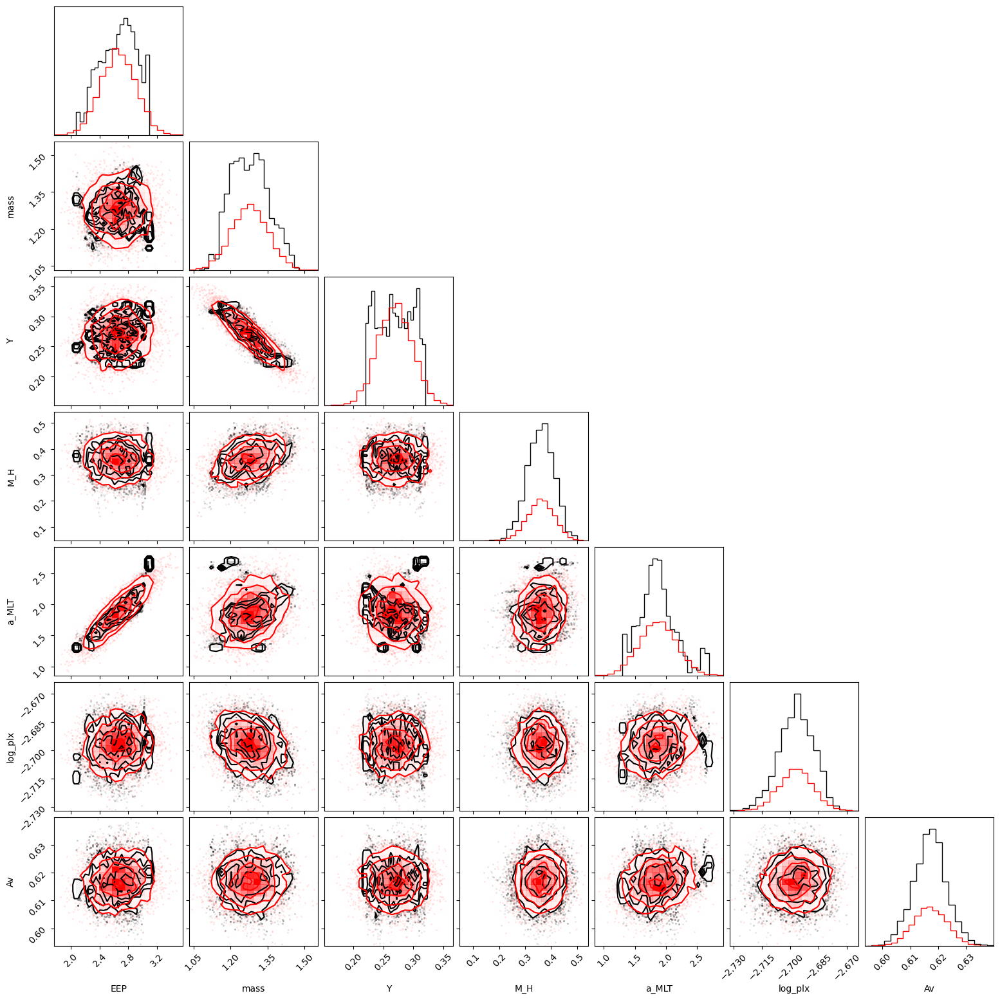

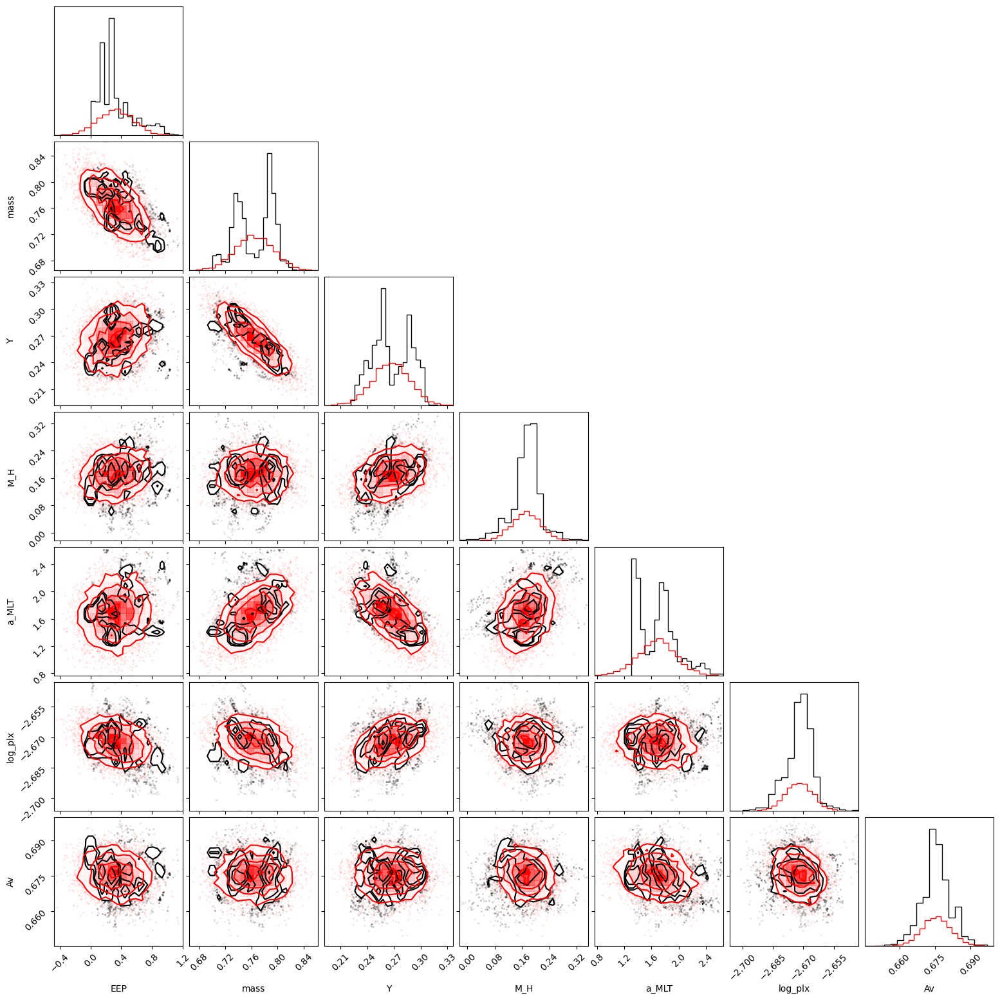

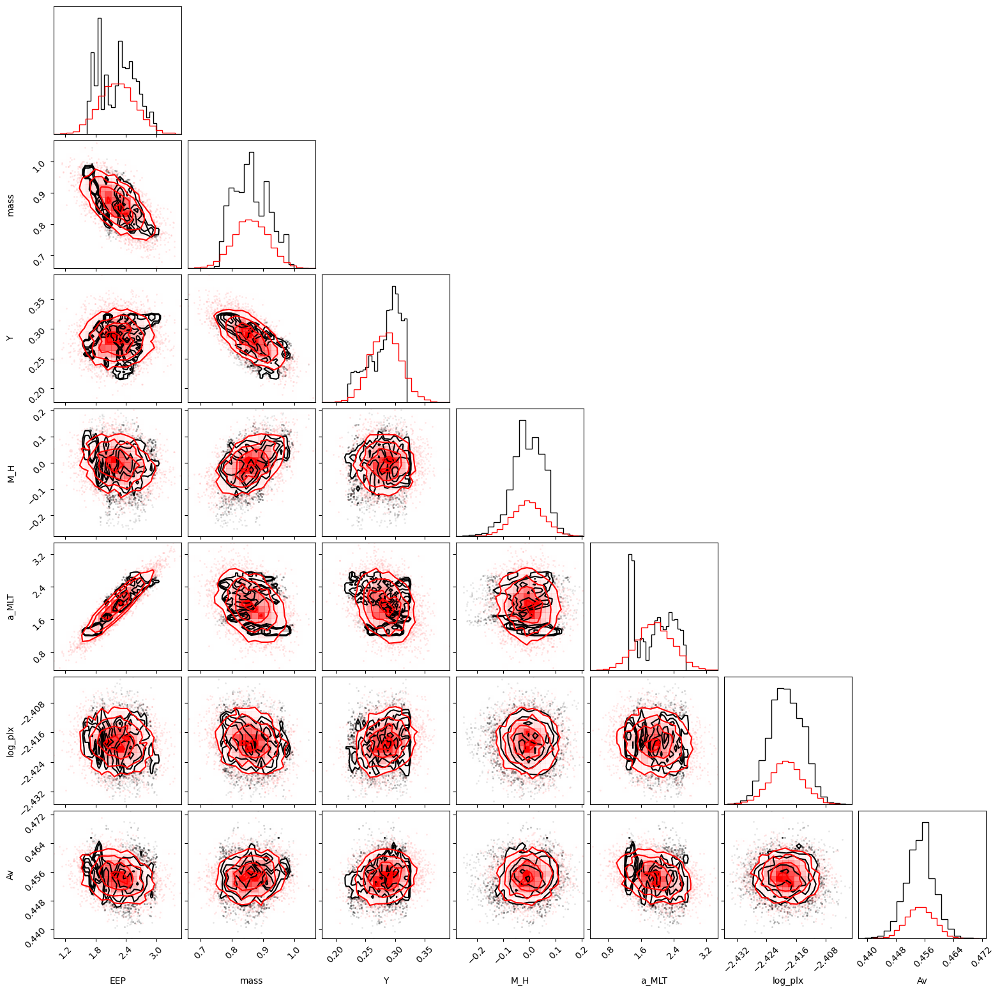

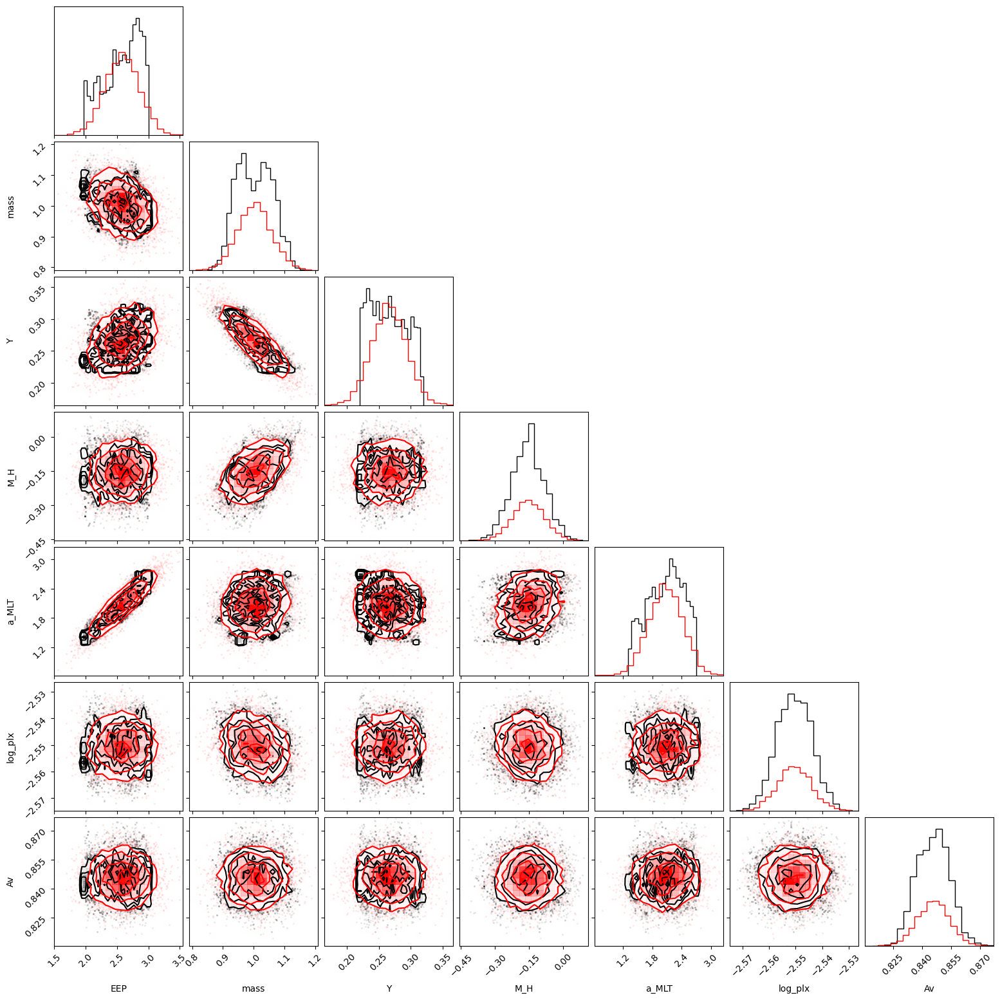

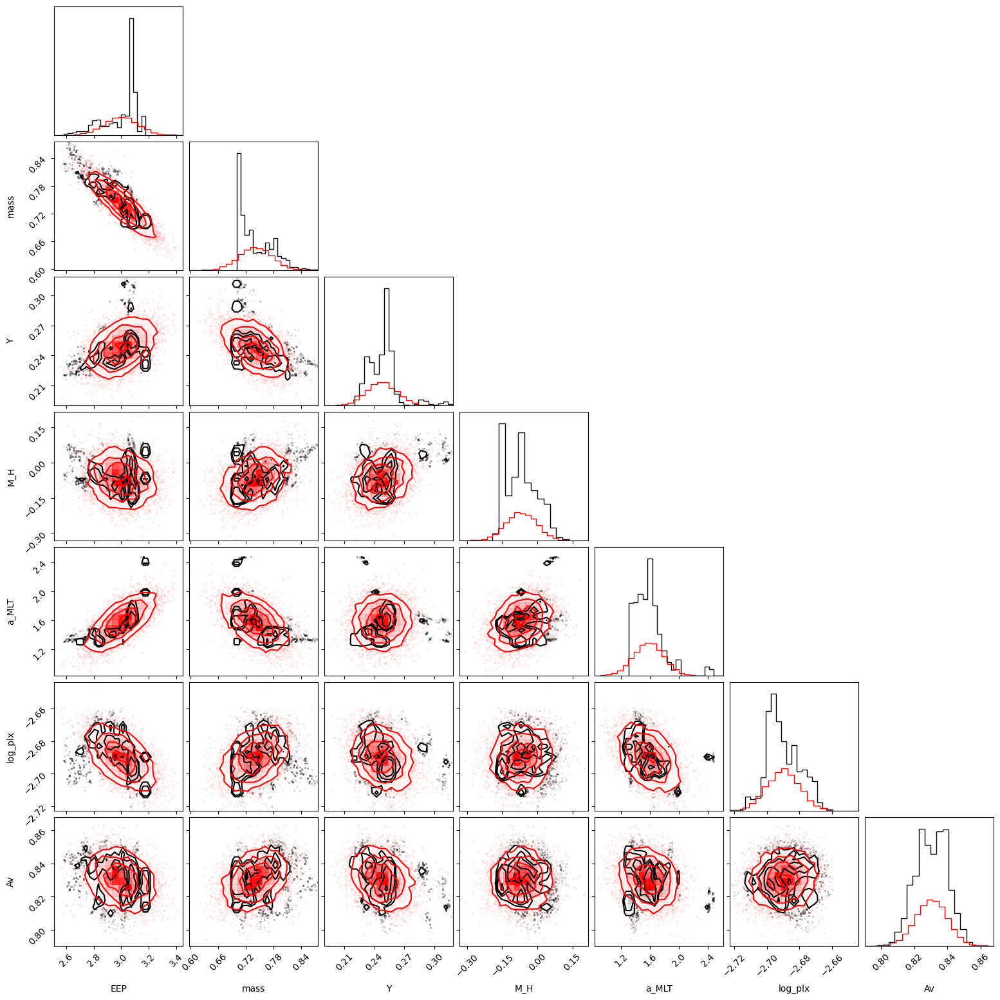

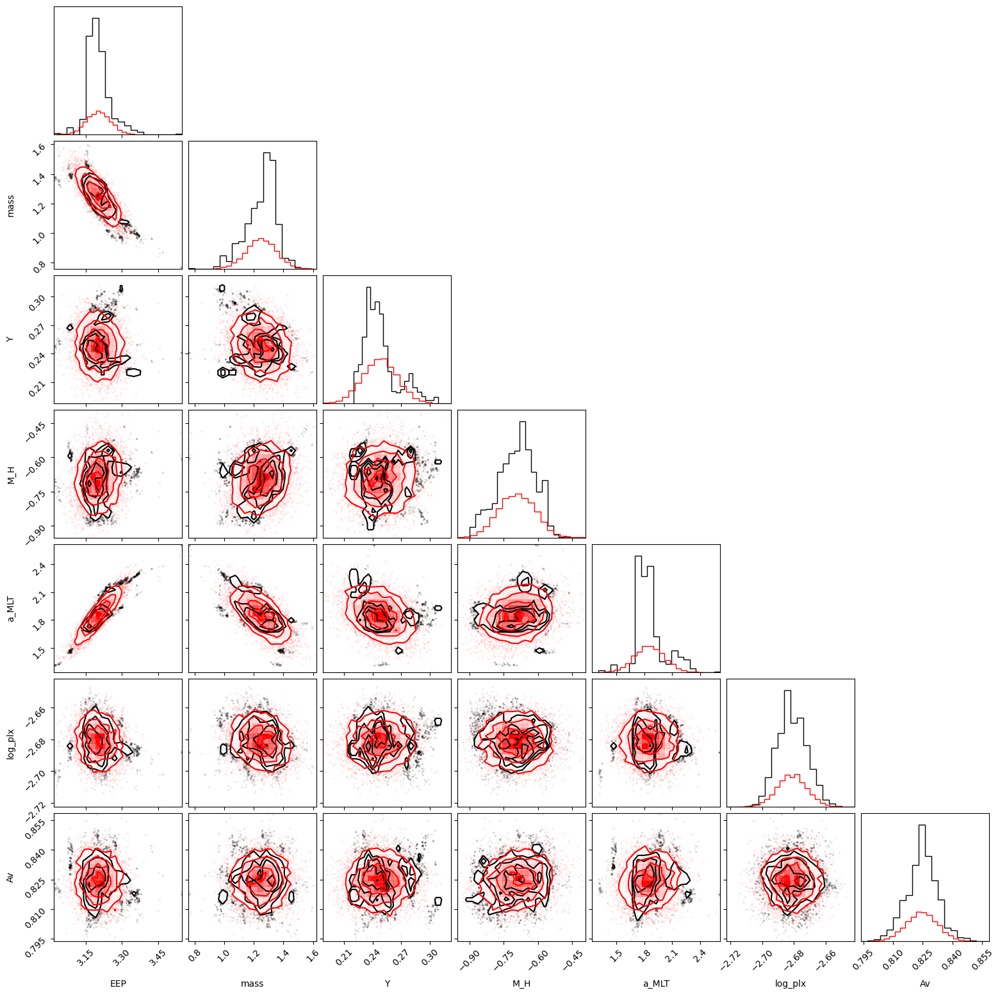

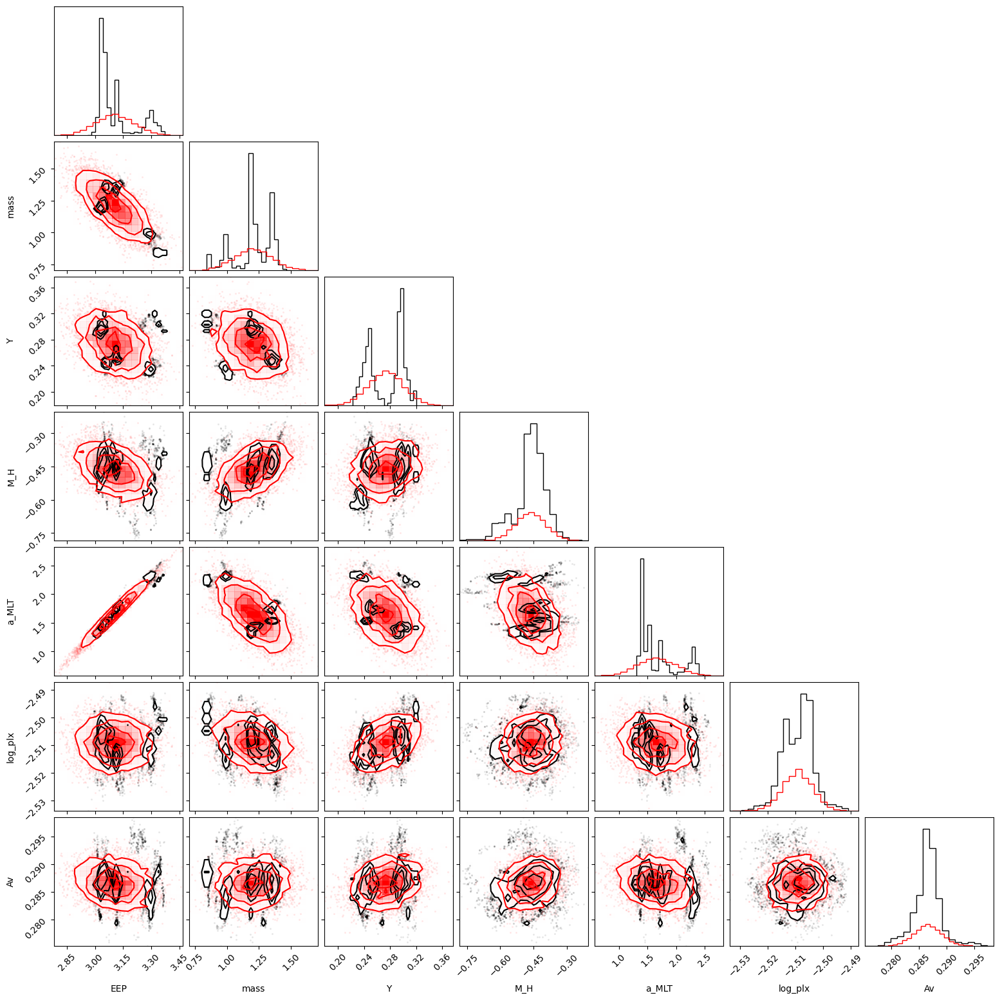

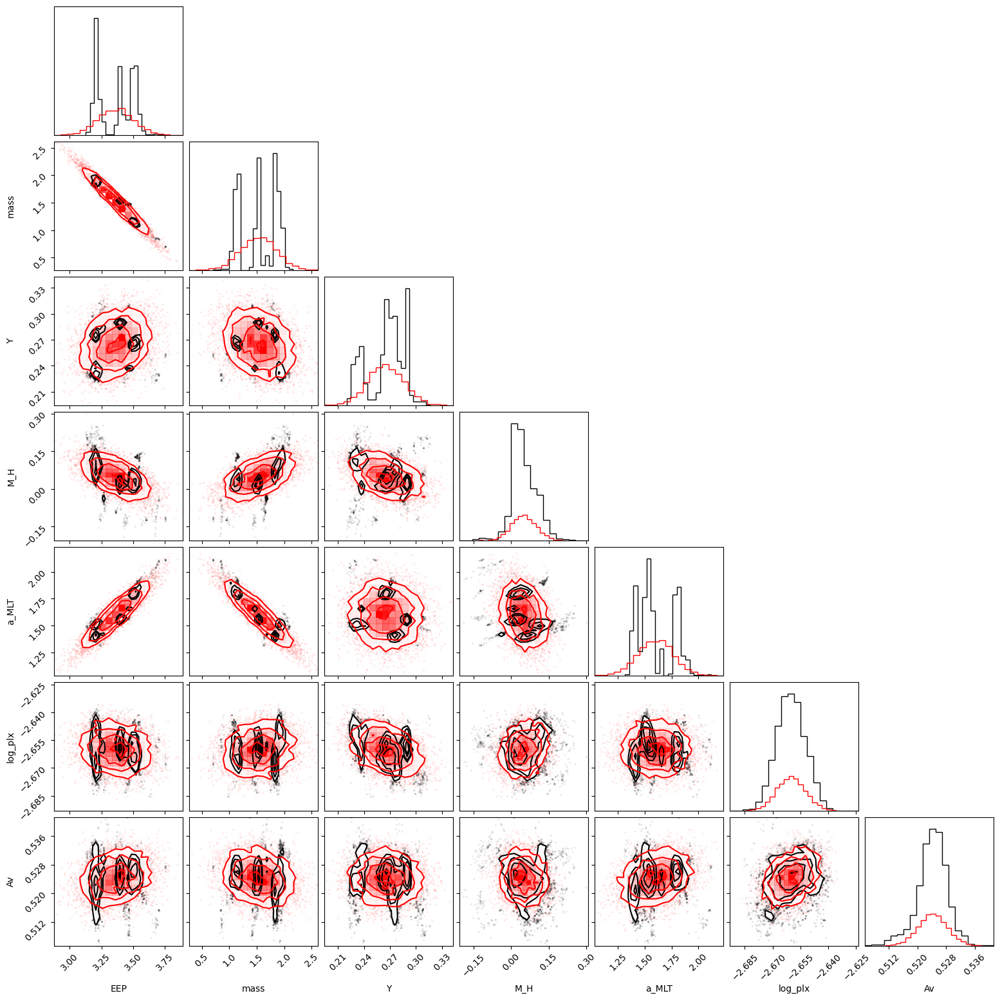

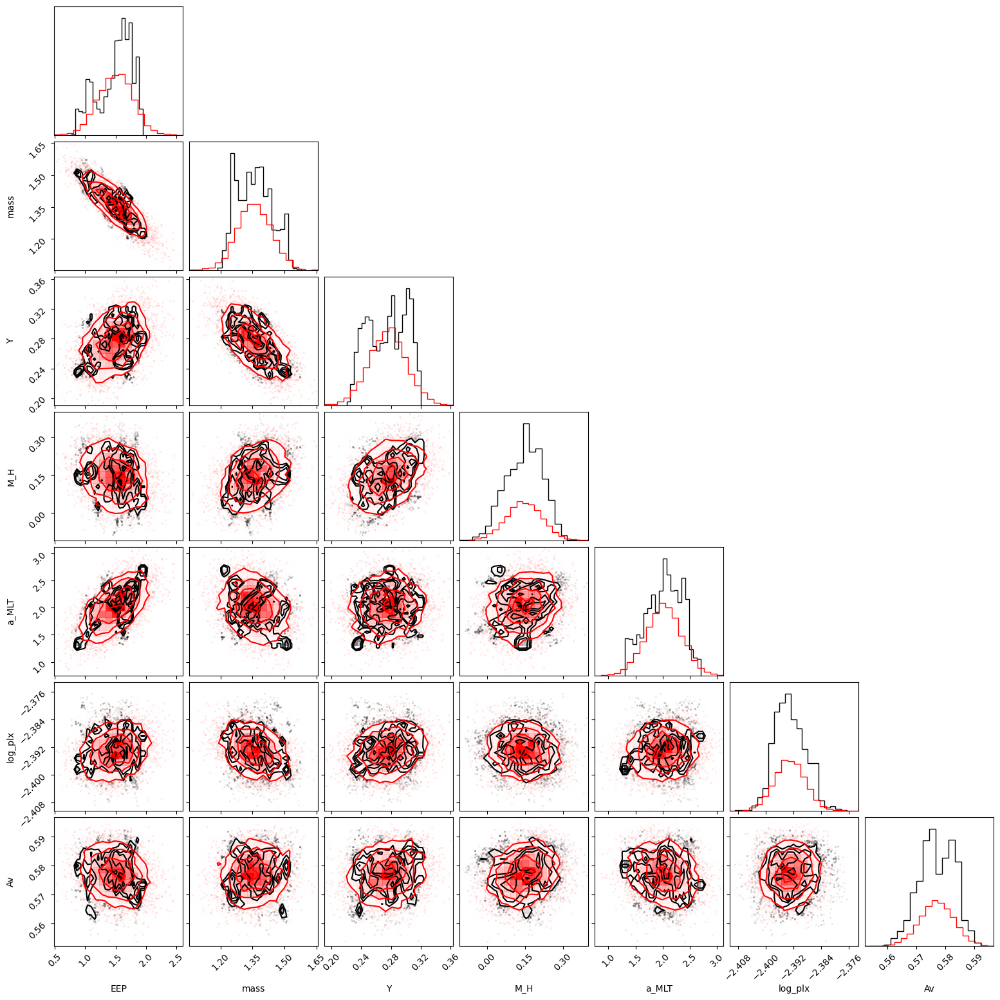

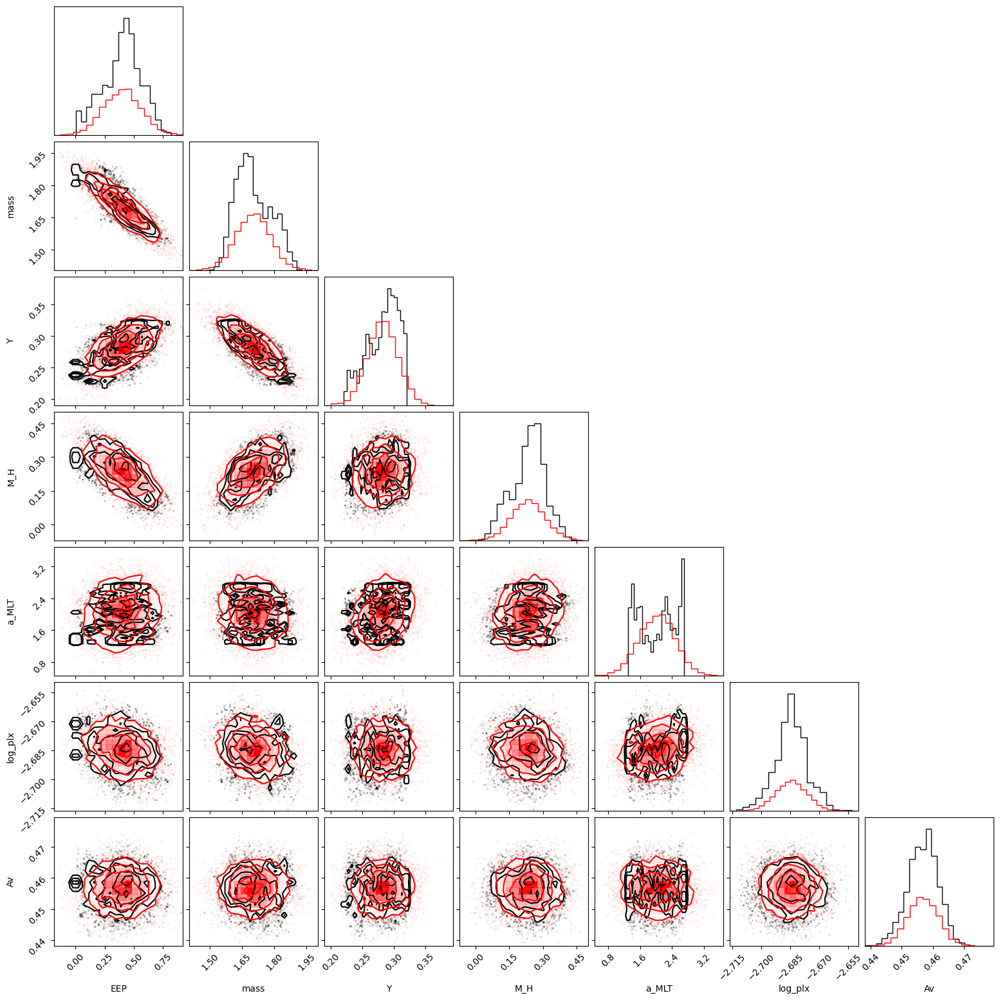

In [14]:
labels = ["EEP", "mass", "Y", "M_H", "a_MLT", "log_plx", "Av"]

for s, a in zip(samples, approx):
    fig = corner(s, labels=labels)
    fig = corner(np.array(a), fig=fig, color="r")

## Mixture model

Don't understand why repeating this gets different results.

In [16]:
from sklearn.mixture import BayesianGaussianMixture

In [354]:
estimator = BayesianGaussianMixture(
    n_components=10,
    max_iter=1000,
)

In [355]:
mean = []
cov = []
weights = []

for s in samples:
    estimator.fit(s)
    mean.append(estimator.means_)
    cov.append(estimator.covariances_)
    weights.append(estimator.weights_)

In [348]:
gmm_samples, _ = estimator.sample(samples[0].shape[0])

In [16]:
# weighted_samples, weights = results[0].samples, results[0].importance_weights()

In [17]:
# rng, key = random.split(rng)
# equal_samples = random.choice(key, weighted_samples, p=weights, shape=(10000,))

In [18]:
# fig = corner(np.array(equal_samples), labels=labels)

In [19]:
# def bm():
#     L_omega = numpyro.sample("L_omega", dist.LKJCholesky(ndim, 1.0))
#     with numpyro.plate("dim", ndim):
# #         x = numpyro.sample("x", dist.Uniform(model.low, model.high))
#         mu_x = numpyro.sample("mu_x", dist.Uniform(model.low, model.high))
#         var_x = numpyro.sample("var_x", dist.HalfCauchy())
#         sigma_x = jnp.sqrt(var_x)
#         L_Omega = jnp.matmul(jnp.diag(sigma_x), L_omega)

#     log_prob = dist.MultivariateNormal(mu_x, scale_tril=L_Omega).log_prob(equal_samples)
#     numpyro.factor("x_obs", log_prob.sum())

In [20]:
# nuts = NUTS(bm)
# mcmc = MCMC(nuts, num_warmup=1000, num_samples=1000, num_chains=10)

In [21]:
# rng, key = random.split(rng)
# mcmc.run(key)

In [22]:
# mcmc.print_summary()

In [358]:
np.array(mean).shape

(10, 10, 7)

In [359]:
weights

[array([0.12547986, 0.09204213, 0.05597782, 0.14078429, 0.12270385,
        0.22567157, 0.09383556, 0.05919996, 0.05324768, 0.03105726]),
 array([0.09175273, 0.06121656, 0.26835912, 0.05003816, 0.14173693,
        0.02388486, 0.06607633, 0.05196033, 0.03531399, 0.20966098]),
 array([0.11543872, 0.15680561, 0.07520783, 0.11111831, 0.02846867,
        0.12999626, 0.07573842, 0.1017334 , 0.08378682, 0.12170596]),
 array([0.10305465, 0.0757044 , 0.02679431, 0.07144106, 0.13024784,
        0.1031455 , 0.14786347, 0.1446746 , 0.11480898, 0.08226518]),
 array([0.22594136, 0.18475141, 0.03403992, 0.02633357, 0.15135481,
        0.07028546, 0.05248161, 0.1545588 , 0.06433268, 0.0359204 ]),
 array([0.08217434, 0.18585729, 0.06714872, 0.27121924, 0.06137451,
        0.07399638, 0.092839  , 0.12703279, 0.01774239, 0.02061534]),
 array([0.16585351, 0.11557364, 0.35186814, 0.13577528, 0.05392545,
        0.03345008, 0.01392043, 0.00669433, 0.0984466 , 0.02449253]),
 array([0.03136048, 0.00679427, 0.

In [374]:
nstar = len(mean)
ndim = len(model.low)

def hbm():
    a_MLT = numpyro.sample("a_MLT", dist.Uniform(1.3, 2.7))
    with numpyro.plate("dim", ndim):
        with numpyro.plate("star", nstar):
            x = numpyro.sample("x", dist.Uniform(model.low, model.high))
    
    with numpyro.plate("star", nstar):
        ln_mass = numpyro.sample("ln_mass", dist.TruncatedNormal(-0.2, 0.7, low=jnp.log(0.7), high=jnp.log(2.3)))
    
    loc = jnp.hstack(
        [x[:, 0, None] ] + [jnp.exp(ln_mass)[:, None]] + \
        [x[:, 2:4]] + [a_MLT * jnp.ones((nstar, 1))] + [x[:, 5:]]
    )
#     loc = jnp.hstack(
#         [x[:, :4]] + [a_MLT * jnp.ones((nstar, 1))] + [x[:, 5:]]
#     )
#     numpyro.sample("x_obs", dist.MultivariateNormal(loc, jnp.array(cov)), obs=jnp.array(mean)) 
    
    mix_dist = dist.Categorical(np.array(weights))
    comp_dist = dist.MultivariateNormal(jnp.array(mean), jnp.array(cov))
    
    numpyro.sample("x_obs", dist.MixtureSameFamily(mix_dist, comp_dist), obs=loc)

In [382]:
from numpyro.infer import init_to_median

In [383]:
nuts = NUTS(hbm, init_strategy=init_to_median)
mcmc = MCMC(nuts, num_warmup=1000, num_samples=1000, num_chains=10)

In [384]:
rng, key = random.split(rng)
mcmc.run(key)

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [385]:
mcmc.print_summary()


                mean       std    median      5.0%     95.0%     n_eff     r_hat
     a_MLT      1.79      0.03      1.78      1.75      1.83     20.08      1.22
ln_mass[0]      0.23      0.05      0.23      0.16      0.30   2006.75      1.00
ln_mass[1]     -0.24      0.02     -0.24     -0.28     -0.21     32.19      1.35
ln_mass[2]     -0.19      0.03     -0.19     -0.24     -0.15   4296.69      1.00
ln_mass[3]     -0.02      0.06     -0.03     -0.10      0.07   1408.37      1.00
ln_mass[4]     -0.30      0.02     -0.31     -0.34     -0.26     12.14      1.33
ln_mass[5]      0.24      0.06      0.24      0.15      0.33    186.11      1.05
ln_mass[6]      0.30      0.02      0.30      0.27      0.33     47.32      1.08
ln_mass[7]      0.14      0.04      0.14      0.08      0.19     64.67      1.07
ln_mass[8]      0.27      0.05      0.27      0.20      0.36     14.47      1.45
ln_mass[9]      0.54      0.05      0.54      0.46      0.61   1142.74      1.01
    x[0,0]      2.64      0

In [386]:
hbm_samples = mcmc.get_samples()

In [391]:
xs = np.array(hbm_samples["x"])
xs[:, :, 1] = jnp.exp(hbm_samples["ln_mass"])
xs[:, :, 4] = hbm_samples["a_MLT"][:, None]

In [392]:
truths["log_plx"] = np.log10(truths["plx"])

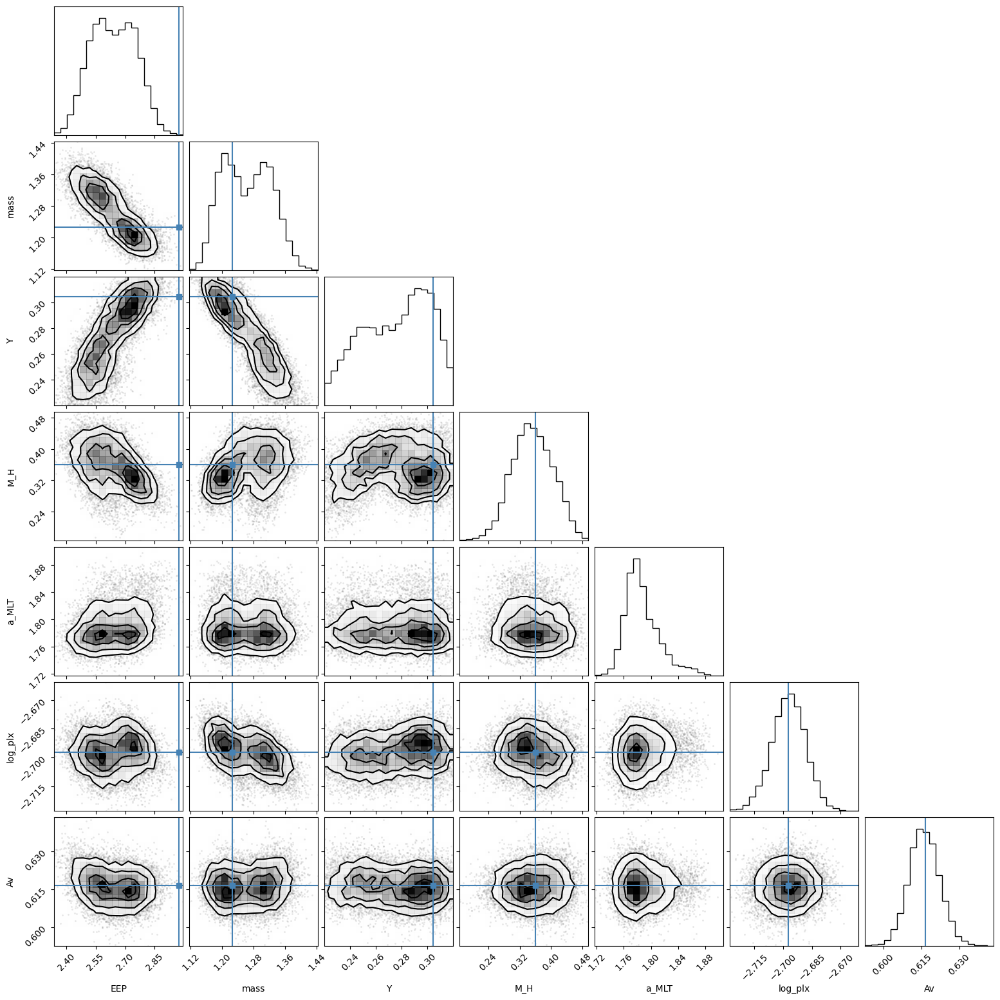

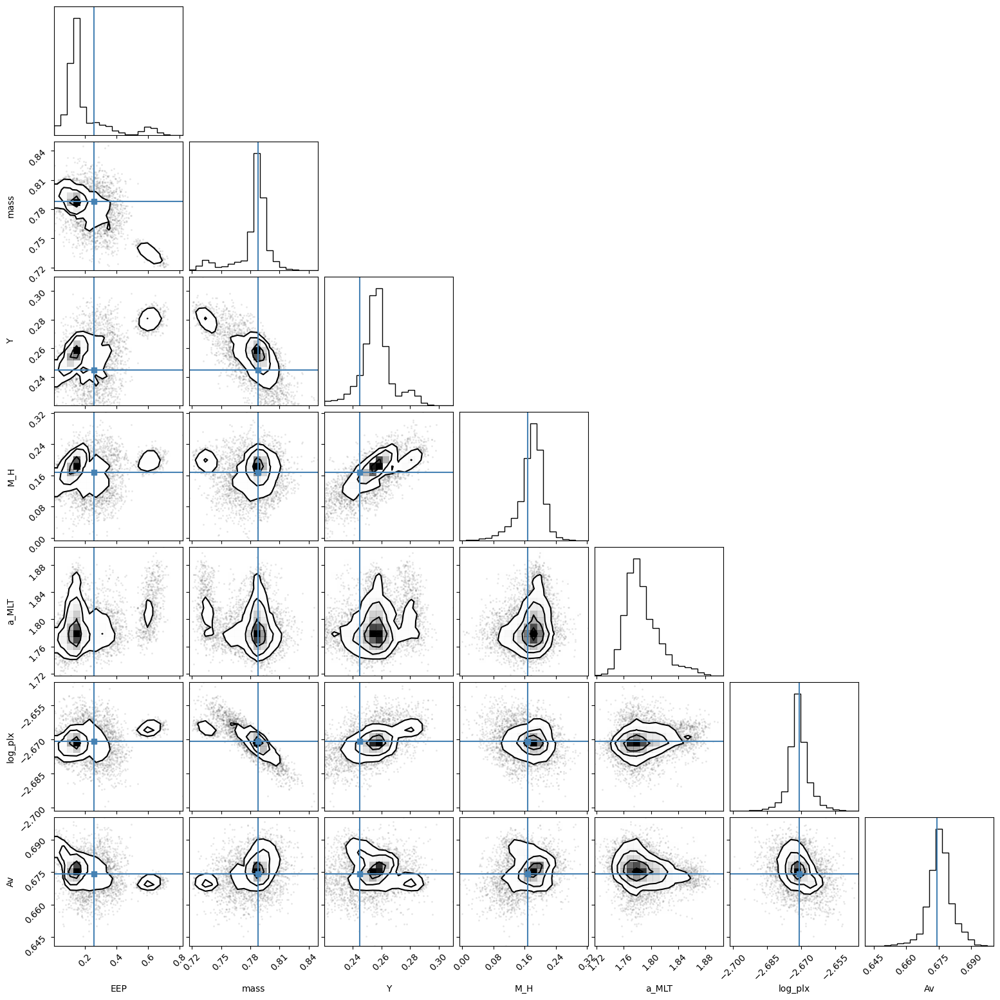

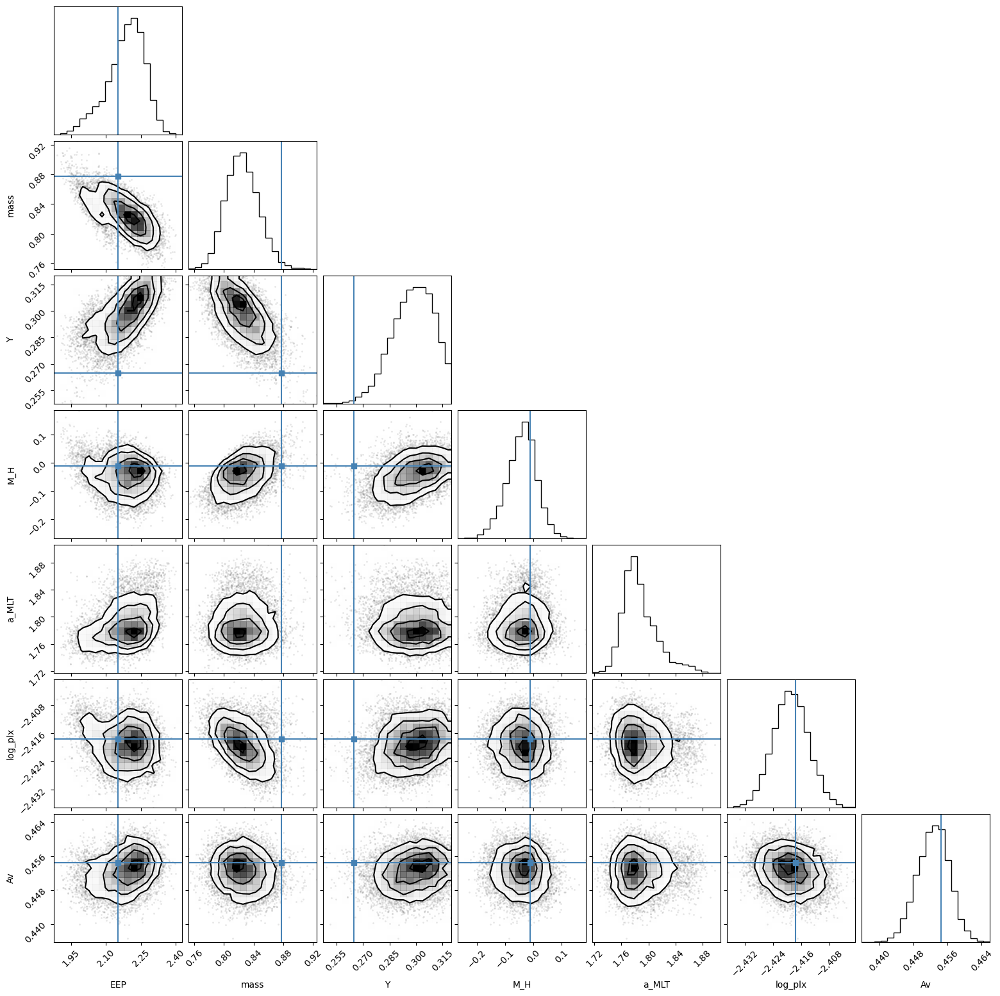

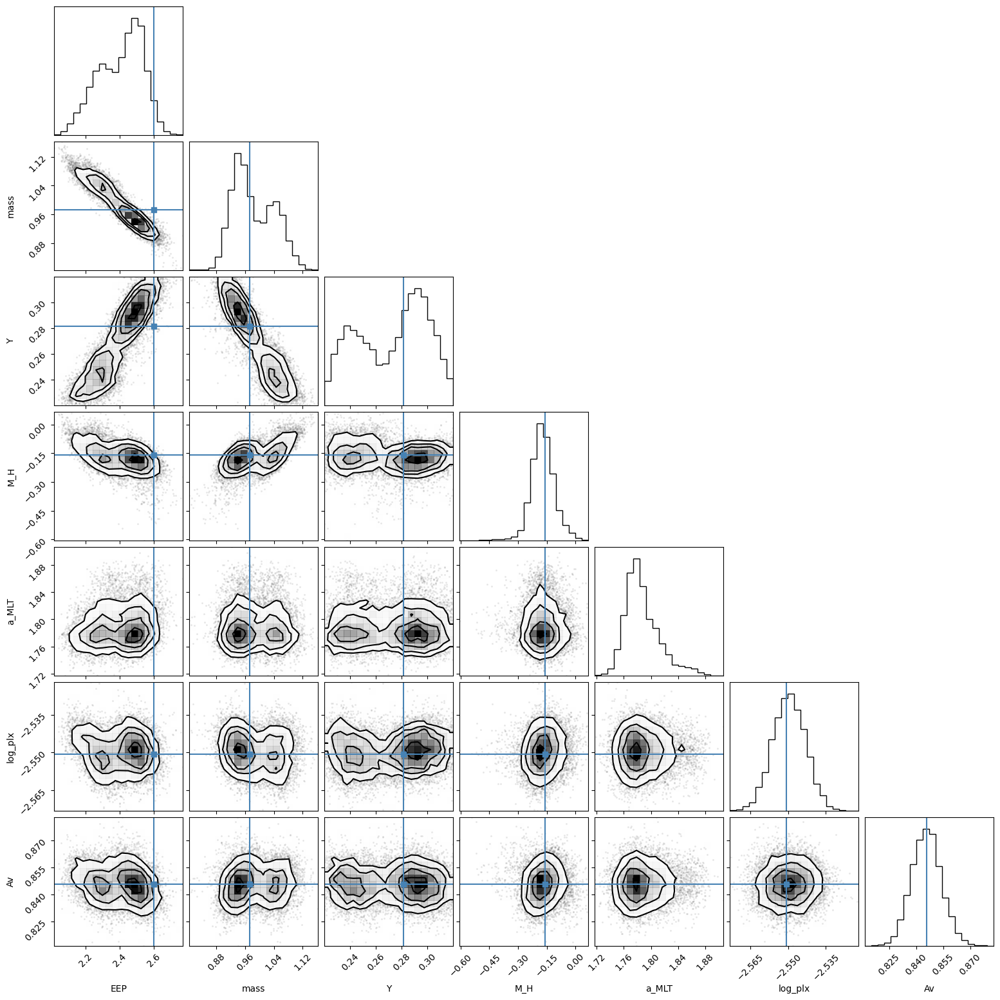

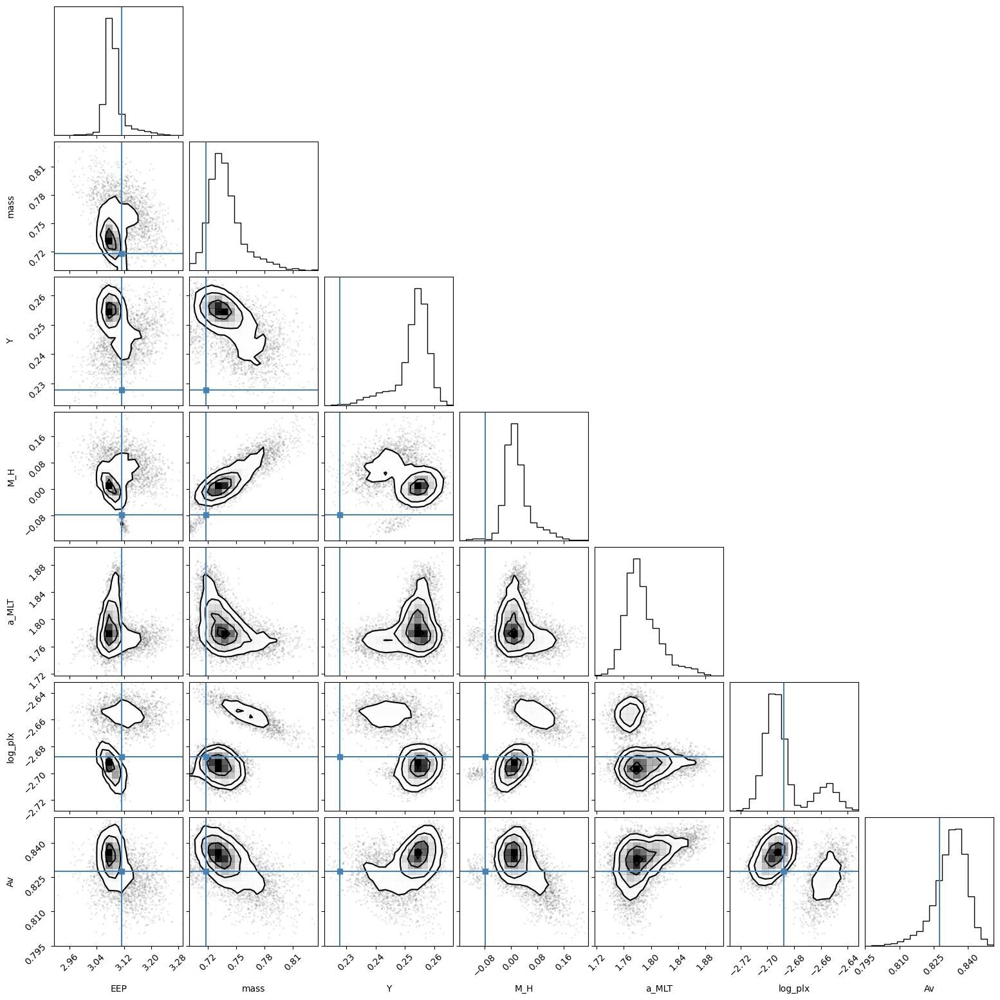

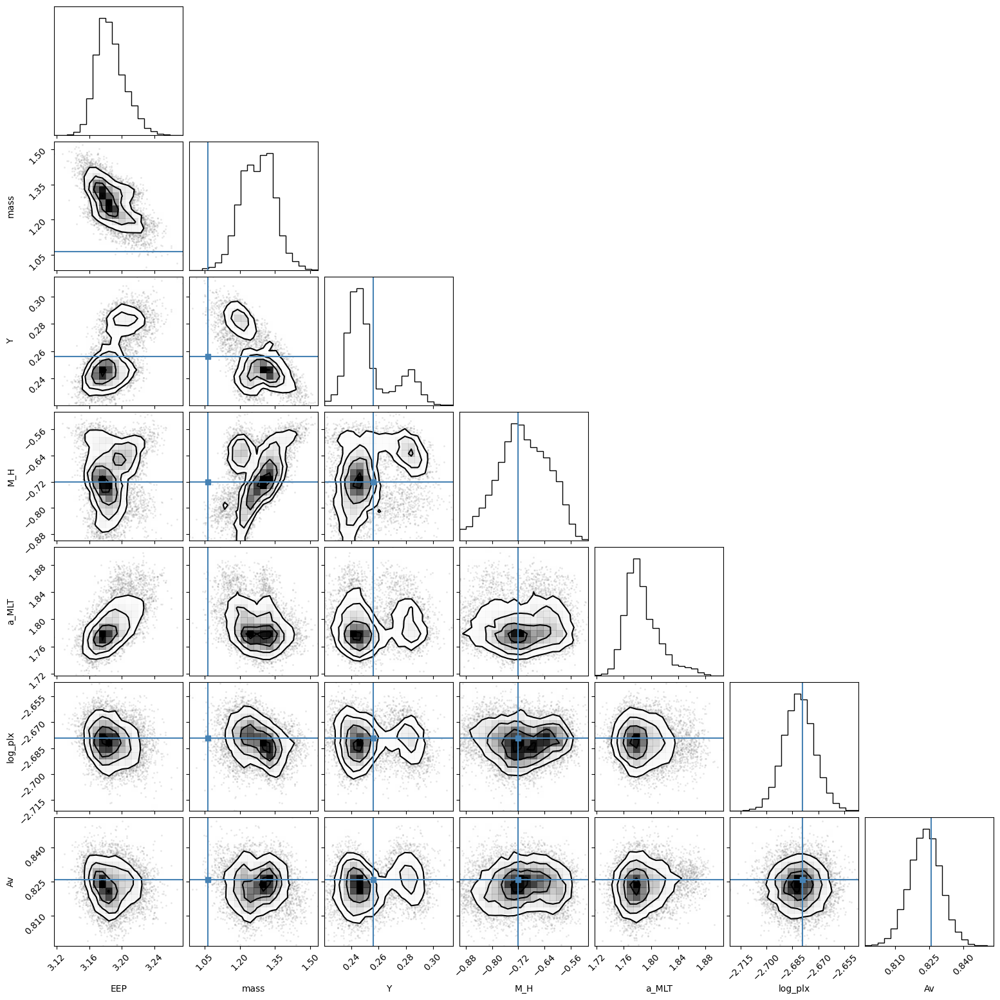

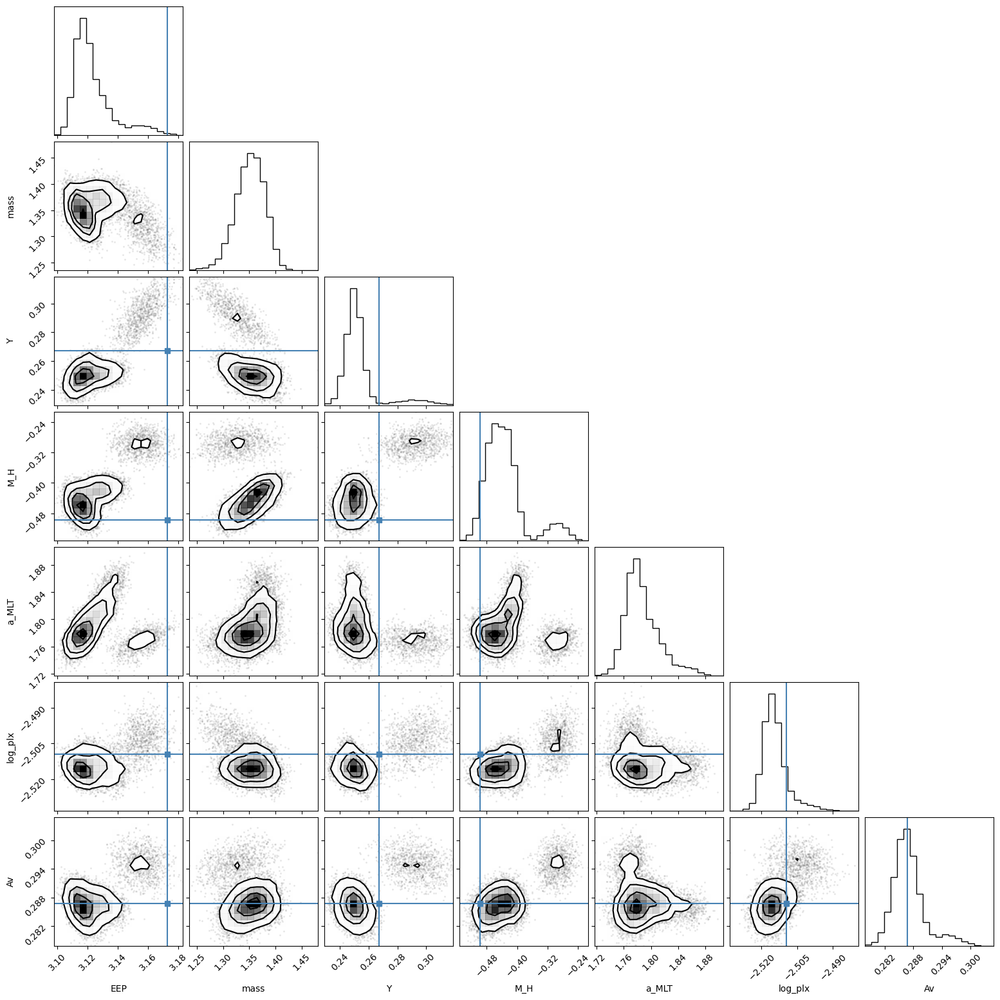

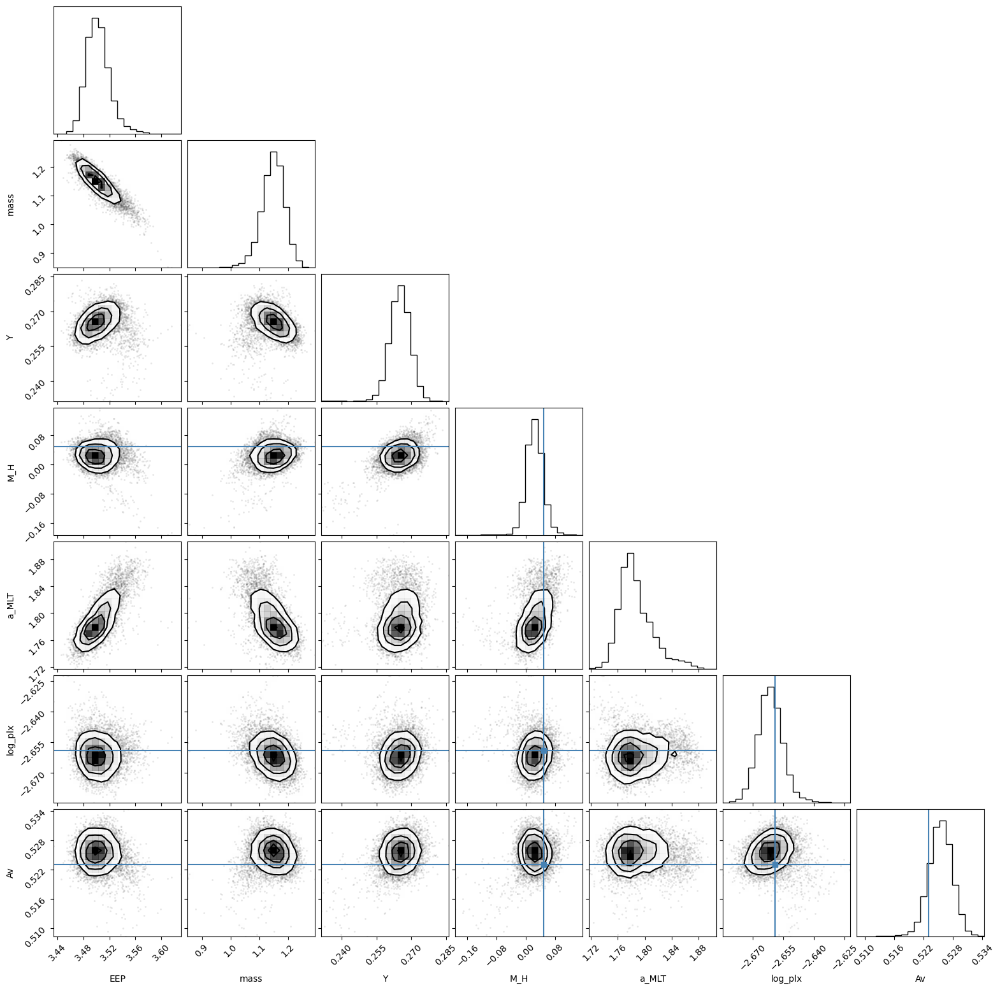

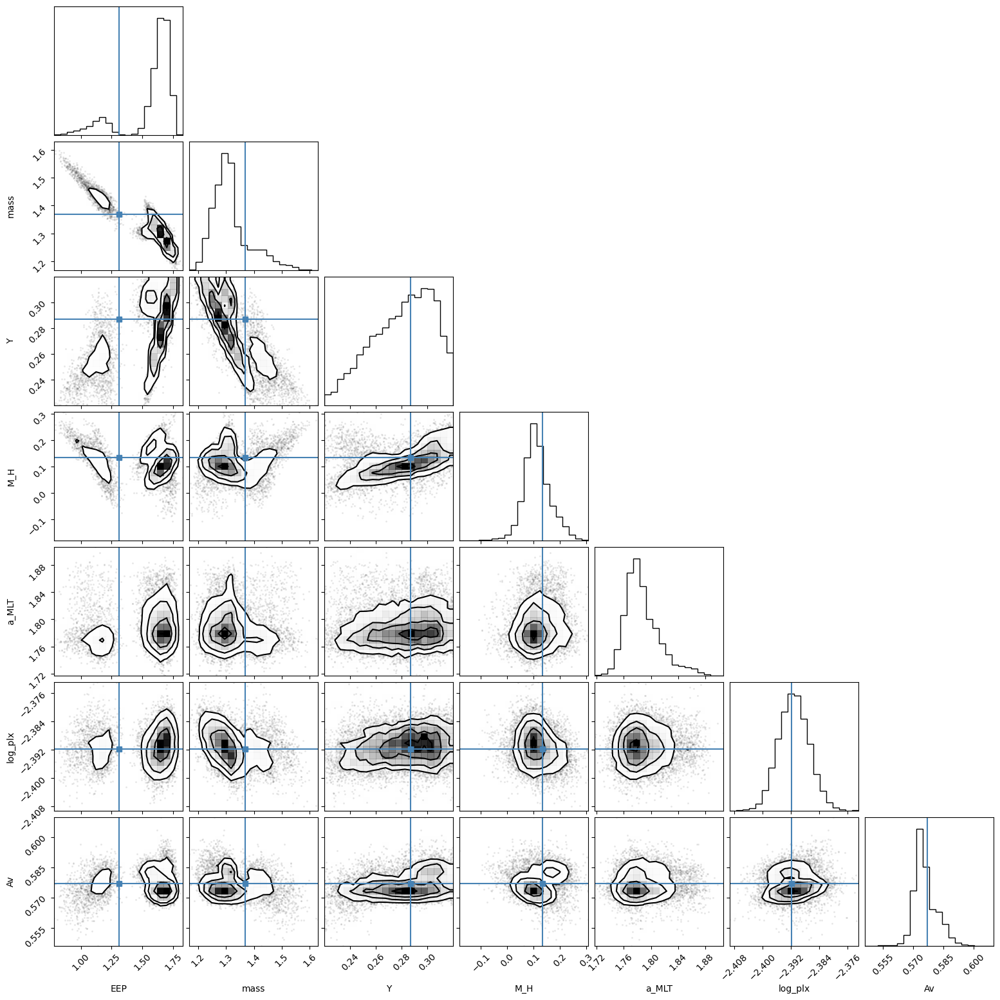

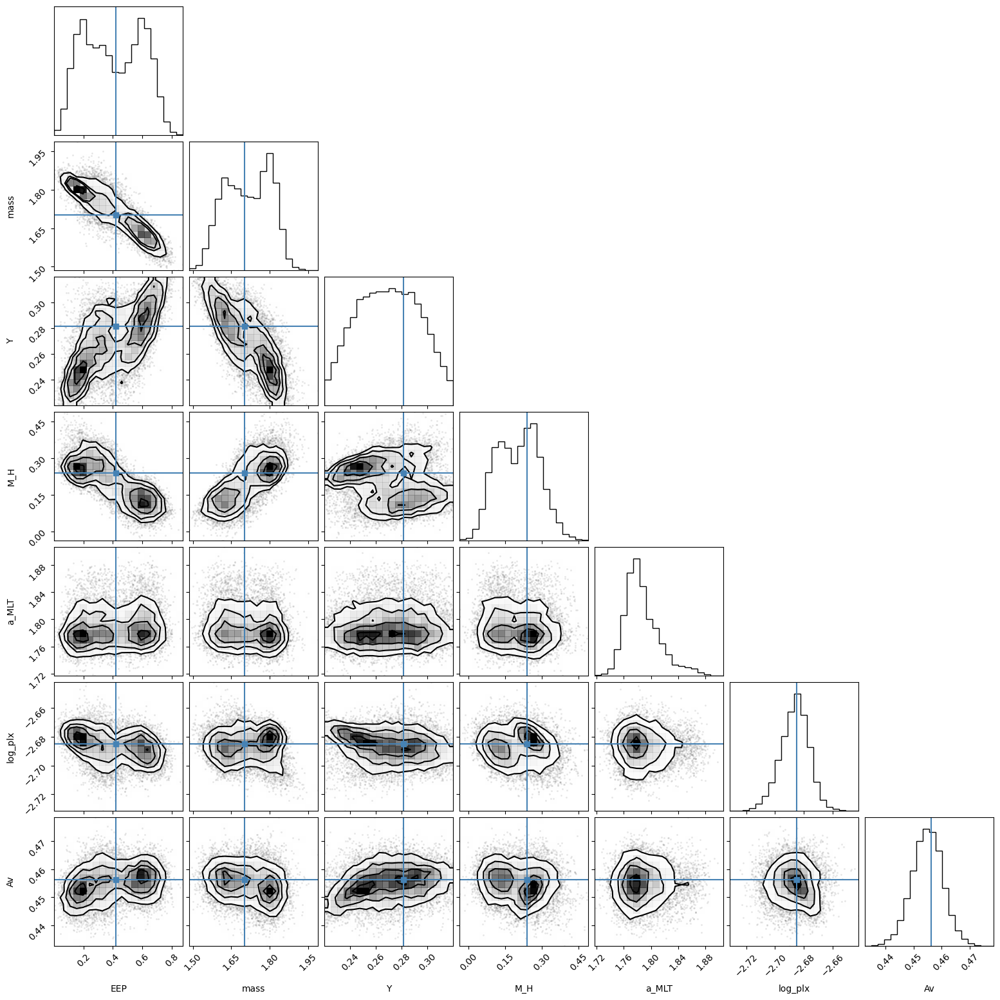

In [393]:
for i, row in truths.iterrows():
    fig = corner(xs[:, i], labels=labels, truths=row[labels].to_numpy())

In [35]:
hbm_mean = np.mean(xs, 0)
hbm_cov = np.array([np.cov(xs[:, i].T) for i in range(nstar)])

In [36]:
hbm_std = vmap(jnp.diag)(hbm_cov)**0.5

In [37]:
std = vmap(jnp.diag)(jnp.array(cov))**0.5

In [38]:
hbm_std[0]

Array([0.12659547, 0.05517299, 0.02261598, 0.04695157, 0.08643876,
       0.00849953, 0.00542857], dtype=float64)

In [39]:
res = xs - truths[labels].to_numpy()

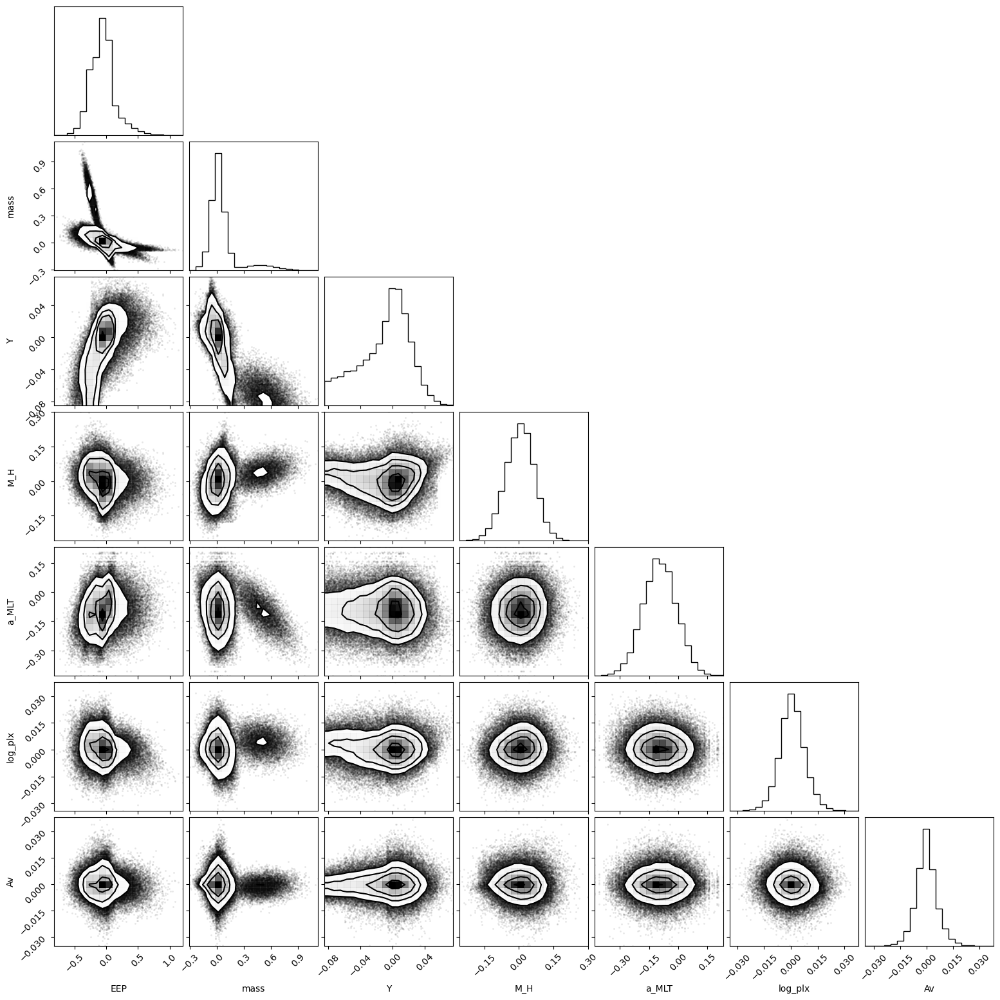

In [40]:
fig = corner(res.reshape((np.prod(res.shape[:2]), res.shape[2])), labels=labels)